# Artifacts detection

Main artifacts to be analysed:
* Eye artifacts
* Hearth beat artifacts

Additionally, bad signals also might interfere with our analysis, so we will try to identify and remove it

In [1]:
import numpy as np
import pandas as pd
from scipy.signal import welch
from utils import get_extracts, plot_rawsignal

from mne.io import read_raw_edf
import mne

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(font_scale=1.2)
sns.set_style(style='white') 

In [2]:
plt.rcParams["figure.figsize"] = (15,7)

In [3]:
files = pd.read_csv('preproc_data/preprocessed.csv')

In [4]:
files.head()

,fn,target,dataset_name,sfreq,channels,n_channels,channels_eeg,n_channels_eeg,seconds
0,b906373005ba09e6.csv,trauma,trauma,125,A1|A2|C3|C4|Cz|F3|F4|F7|F8|Fp1|Fp2|Fz|O1|O2|P3...,21,NaN,0,238.0
1,bdcff4b8f633033a.csv,trauma,trauma,125,EEG A1-N|EEG A2-A1|EEG C3-A1|EEG C4-A1|EEG Cz-...,30,EEG A1-N|EEG A2-A1|EEG C3-A1|EEG C4-A1|EEG Cz-...,21,32.0
2,521a5a6f578df78a.csv,trauma,trauma,125,EEG A1-N|EEG A2-A1|EEG C3-A1|EEG C4-A1|EEG Cz-...,30,EEG A1-N|EEG A2-A1|EEG C3-A1|EEG C4-A1|EEG Cz-...,21,57.0
3,bc8568311c86157d.csv,trauma,trauma,125,EEG A1|EEG A2|EEG C3|EEG C4|EEG Cb1|EEG Cz|EEG...,24,EEG A1|EEG A2|EEG C3|EEG C4|EEG Cb1|EEG Cz|EEG...,24,166.0
4,5c9ca89c610ef553.csv,trauma,trauma,125,EEG A1-N|EEG A2-A1|EEG C3-A1|EEG C4-A1|EEG Cz-...,27,EEG A1-N|EEG A2-A1|EEG C3-A1|EEG C4-A1|EEG Cz-...,21,69.0


### Random raw signal analysis

We choose 3 from trauma group and 1 from healthy

In [5]:
raw1 = read_raw_edf(f'raw_data/trauma/{files.fn[5][:-4]}.edf', preload=True)
raw2 = read_raw_edf(f'raw_data/trauma/{files.fn[40][:-4]}.edf', preload=True)
raw3 = read_raw_edf(f'raw_data/trauma/{files.fn[72][:-4]}.edf', preload=True)
raw4 = read_raw_edf(f'raw_data/healthy/{files.fn[130][:-4]}.edf', preload=True)

Extracting EDF parameters from /Users/jaspersw./Documents/neuroml/brain-trauma-detection/raw_data/trauma/2a4a9f39f461ddbd.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 32999  =      0.000 ...   131.996 secs...
Extracting EDF parameters from /Users/jaspersw./Documents/neuroml/brain-trauma-detection/raw_data/trauma/25313f2f5b6854da.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 16249  =      0.000 ...    64.996 secs...
Extracting EDF parameters from /Users/jaspersw./Documents/neuroml/brain-trauma-detection/raw_data/trauma/9396b2261349267f.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 24499  =      0.000 ...    97.996 secs...
Extracting EDF parameters from /Users/jaspersw./Documents/neuroml/brain-trauma-detection/raw_data/healthy/89cba2dac79956d1.edf...
EDF file detected
Setting channel info structure...
Creating raw.i

<ipython-input-5-5f29843853d6>:1: RuntimeWarning: 3 channel names are too long, have been truncated to 15 characters:
['POLY PPG 36: FPG', 'POLY SGR 37: KGR', 'POLY Resp 38: RD']
  raw1 = read_raw_edf(f'raw_data/trauma/{files.fn[5][:-4]}.edf', preload=True)
<ipython-input-5-5f29843853d6>:2: RuntimeWarning: 3 channel names are too long, have been truncated to 15 characters:
['POLY PPG 36: FPG', 'POLY SGR 37: KGR', 'POLY Resp 38: RD']
  raw2 = read_raw_edf(f'raw_data/trauma/{files.fn[40][:-4]}.edf', preload=True)


Metadata information

In [6]:
print(raw1.info, raw2.info, raw3.info, raw4.info)

<Info | 7 non-empty values
 bads: []
 ch_names: EEG Fp1-A1, EEG Fp2-A2, EEG F7-A1, EEG F3-A1, EEG Fz-A1, EEG ...
 chs: 27 EEG, 1 STIM
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: 2016-04-20 22:20:44 UTC
 nchan: 28
 projs: []
 sfreq: 250.0 Hz
> <Info | 7 non-empty values
 bads: []
 ch_names: EEG Fp1-A1, EEG Fp2-A2, EEG F7-A1, EEG F3-A1, EEG Fz-A1, EEG ...
 chs: 27 EEG, 1 STIM
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: 2016-04-05 21:31:48 UTC
 nchan: 28
 projs: []
 sfreq: 250.0 Hz
> <Info | 7 non-empty values
 bads: []
 ch_names: EEG Fp1-A1, EEG Fp2-A2, EEG F7-A1, EEG F3-A1, EEG Fz-A1, EEG ...
 chs: 21 EEG
 custom_ref_applied: False
 highpass: 1.6 Hz
 lowpass: 70.0 Hz
 meas_date: 2018-12-22 07:15:28 UTC
 nchan: 21
 projs: []
 sfreq: 250.0 Hz
> <Info | 7 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F7, F3, Fz, F4, F8, T3, C3, Cz, C4, T4, T5, P3, Pz, ...
 chs: 21 EEG, 1 STIM
 custom_ref_applied: False
 highpass: 0.0 Hz
 low

Raw signals
First 3 are from trauma group and 
last is from healthy group

Effective window size : 8.192 (s)


<ipython-input-7-b3600072477f>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw1.plot_psd();


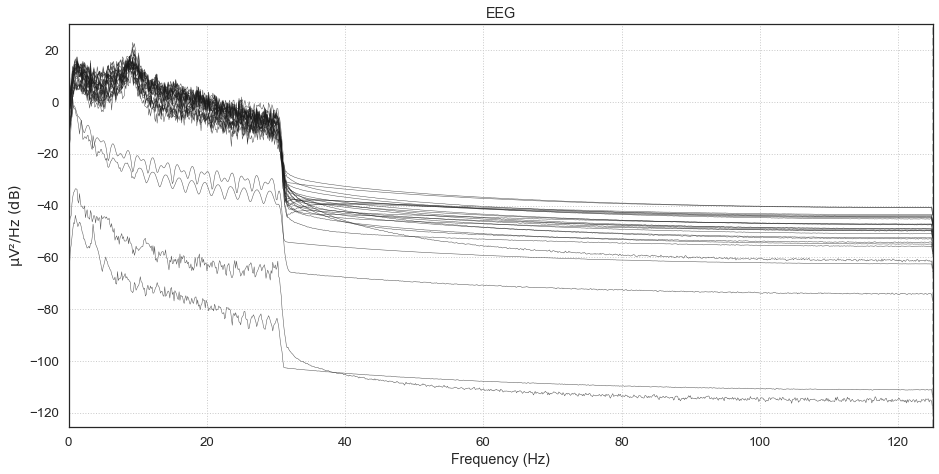

Effective window size : 8.192 (s)


<ipython-input-7-b3600072477f>:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw2.plot_psd();


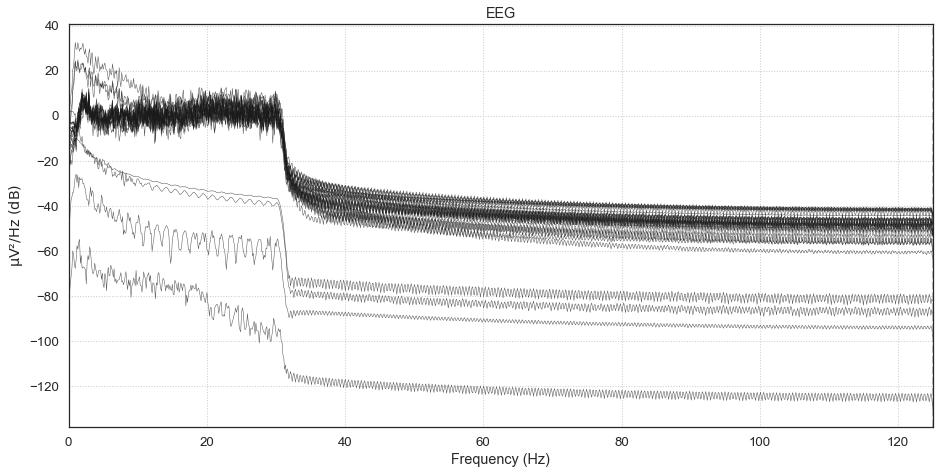

Effective window size : 8.192 (s)


<ipython-input-7-b3600072477f>:3: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw3.plot_psd();


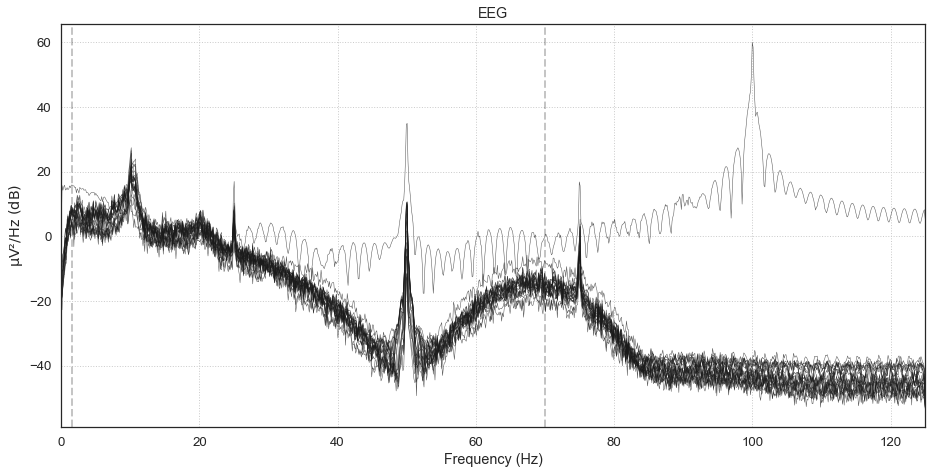

Effective window size : 8.192 (s)


<ipython-input-7-b3600072477f>:4: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw4.plot_psd();


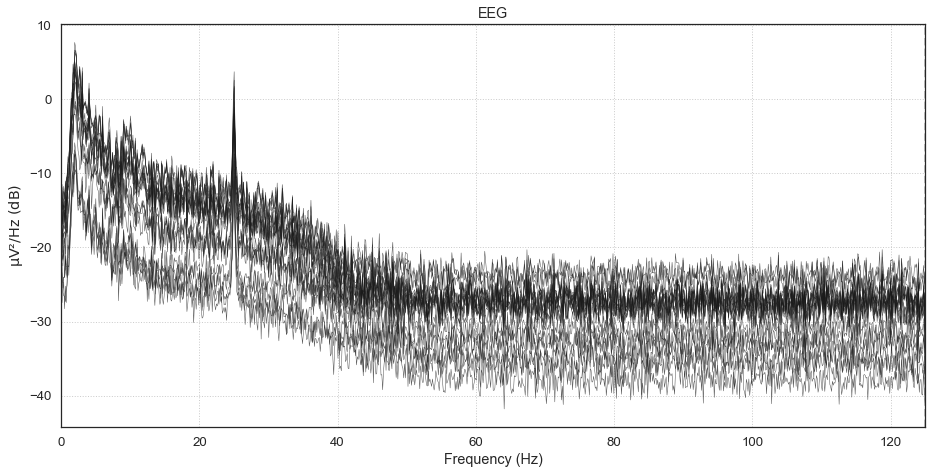

In [7]:
raw1.plot_psd();
raw2.plot_psd();
raw3.plot_psd();
raw4.plot_psd();

Total of subjects by group

In [8]:
files.target.value_counts()

healthy    152
trauma      76
Name: target, dtype: int64

Length of signal distribution in secs recorded 

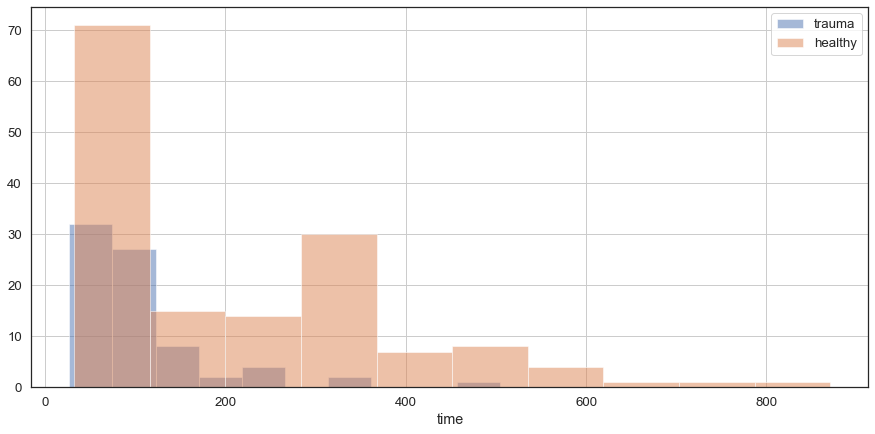

In [9]:
files[files['target']=='trauma']['seconds'].hist(alpha=0.5, label='trauma')
files[files['target']=='healthy']['seconds'].hist(alpha=0.5, label='healthy')
plt.xlabel('time')
plt.legend()

**10-20 System**

In [10]:
# Total channels
ten_twenty_montage = mne.channels.make_standard_montage('standard_1020')
len(ten_twenty_montage.ch_names)

94

In [11]:
# Channels to focus on
channels_ = [
    # prefrontal
    'Fp1',
    'Fp2',
    # frontal
    'F7',
    'F3',
    'F4',
    'Fz',
    'F8',
    # central and temporal
    'T7',
    'C3',
    'Cz',
    'C4',
    'T8',
    # parietal
    'P7',
    'P3',
    'Pz',
    'P4',
    'P8',
    # occipital
    'O1',
    'O2',
]

**Normalizing channel names**

In [12]:
raw = raw1.copy()
raw_channels = raw.ch_names

ch_picked = {rch:ch for ch in channels_ for rch in raw_channels if ch.lower() in rch.lower()}

In [13]:
sample = raw.copy().pick_channels(list(ch_picked.keys()))
sample.rename_channels(ch_picked)

<RawEDF | 2a4a9f39f461ddbd.edf, 15 x 33000 (132.0 s), ~3.8 MB, data loaded>

In [14]:
ch_map = {ch.lower(): ch for ch in sample.ch_names}

In [15]:
ten_twenty_montage.ch_names = [ch_map[ch.lower()] if ch.lower() in ch_map else ch 
                               for ch in ten_twenty_montage.ch_names]

In [16]:
sample.set_montage(ten_twenty_montage)

sample1 = sample.copy()

<Figure size 360x360 with 0 Axes>

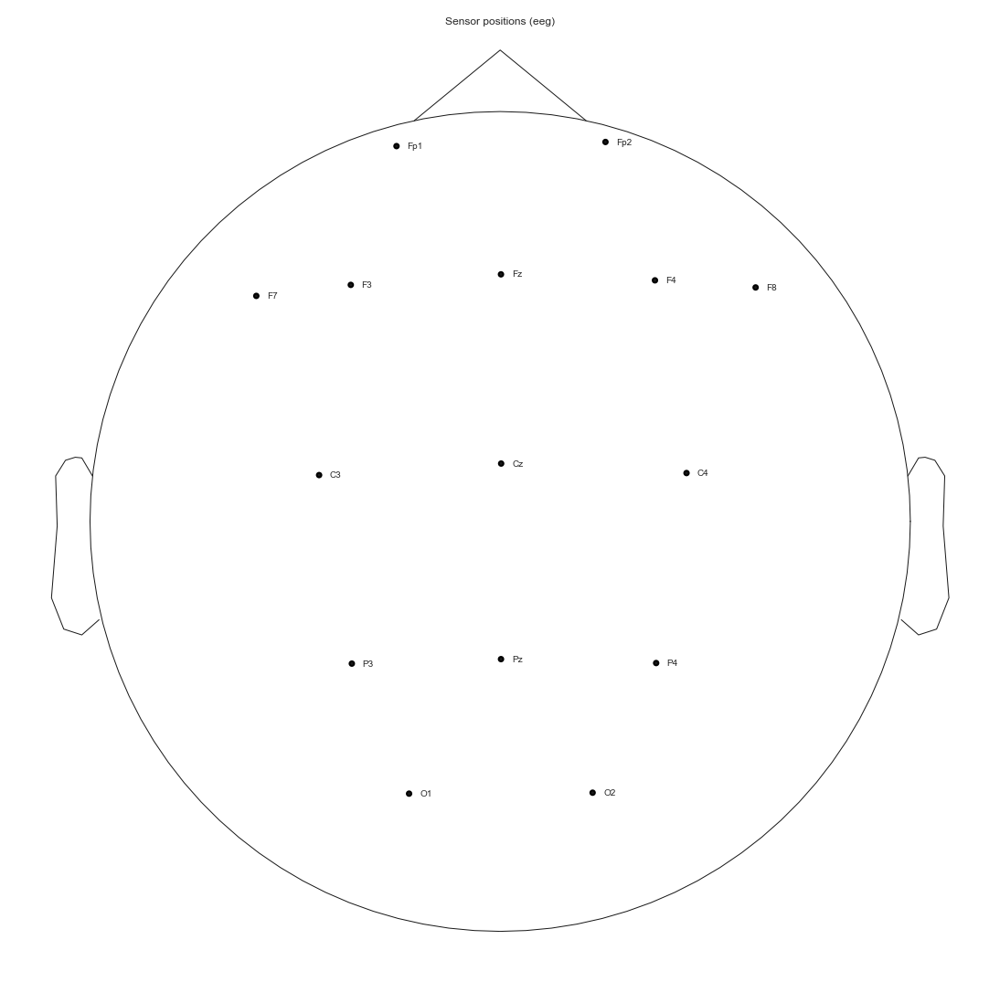

In [17]:
fig = plt.figure(figsize=[5,5])
sample1.plot_sensors(show_names=True);

Effective window size : 8.192 (s)


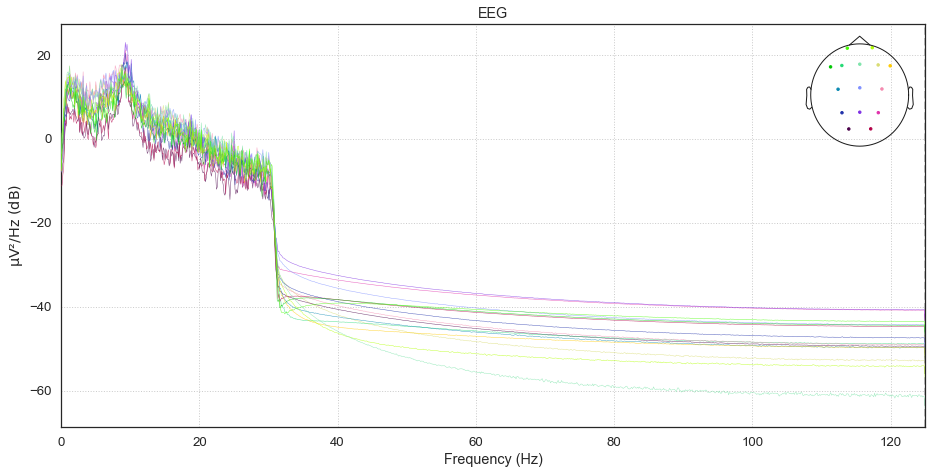

In [18]:
sample1.plot_psd();

* Raw 2

Effective window size : 8.192 (s)


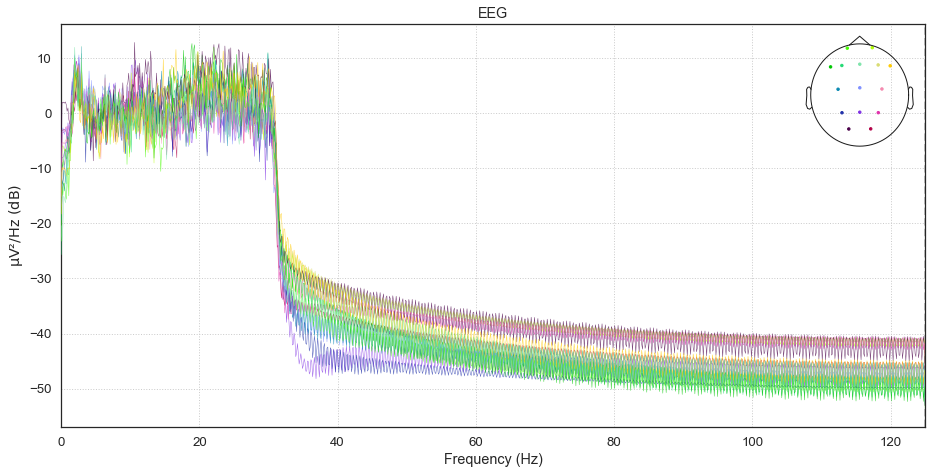

In [19]:
raw = raw2.copy()
raw_channels = raw.ch_names

ch_picked = {rch:ch for ch in channels_ for rch in raw_channels if ch.lower() in rch.lower()}
sample = raw.copy().pick_channels(list(ch_picked.keys()))
sample.rename_channels(ch_picked)
ch_map = {ch.lower(): ch for ch in sample.ch_names}
ten_twenty_montage.ch_names = [ch_map[ch.lower()] if ch.lower() in ch_map else ch 
                               for ch in ten_twenty_montage.ch_names]
sample.set_montage(ten_twenty_montage)

sample2 = sample.copy()

sample2.plot_psd();

* Raw 3

Effective window size : 8.192 (s)


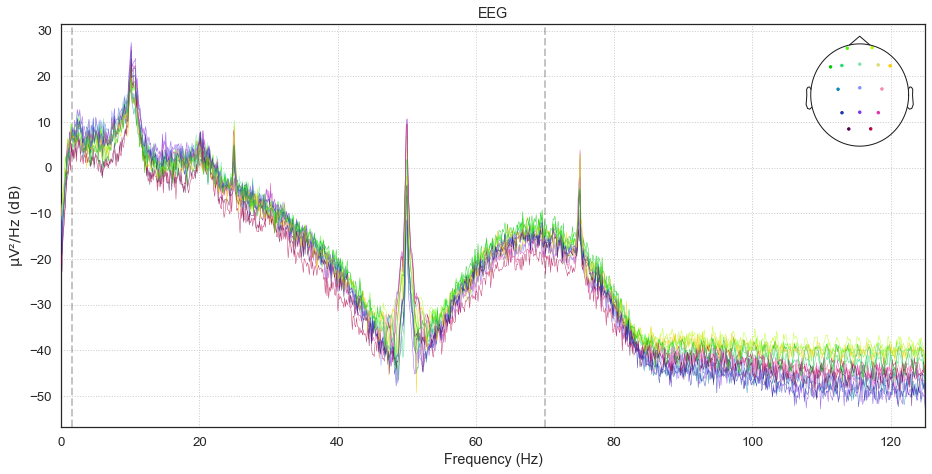

In [20]:
raw = raw3.copy()
raw_channels = raw.ch_names

ch_picked = {rch:ch for ch in channels_ for rch in raw_channels if ch.lower() in rch.lower()}
sample = raw.copy().pick_channels(list(ch_picked.keys()))
sample.rename_channels(ch_picked)
ch_map = {ch.lower(): ch for ch in sample.ch_names}
ten_twenty_montage.ch_names = [ch_map[ch.lower()] if ch.lower() in ch_map else ch 
                               for ch in ten_twenty_montage.ch_names]
sample.set_montage(ten_twenty_montage)

sample3 = sample.copy()

sample3.plot_psd();

* Raw 4

Effective window size : 8.192 (s)


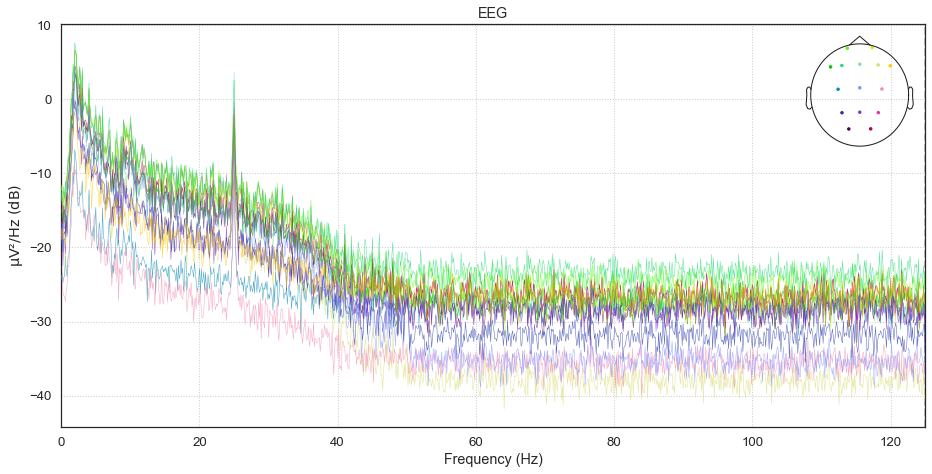

In [21]:
raw = raw4.copy()
raw_channels = raw.ch_names

ch_picked = {rch:ch for ch in channels_ for rch in raw_channels if ch.lower() in rch.lower()}
sample = raw.copy().pick_channels(list(ch_picked.keys()))
sample.rename_channels(ch_picked)
ch_map = {ch.lower(): ch for ch in sample.ch_names}
ten_twenty_montage.ch_names = [ch_map[ch.lower()] if ch.lower() in ch_map else ch 
                               for ch in ten_twenty_montage.ch_names]
sample.set_montage(ten_twenty_montage)

sample4 = sample.copy()

sample4.plot_psd();

### Band filtering

In [22]:
sample1_ = sample1.copy().filter(l_freq=1, h_freq=30, method='iir')

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 30.00 Hz: -6.02, -6.02 dB



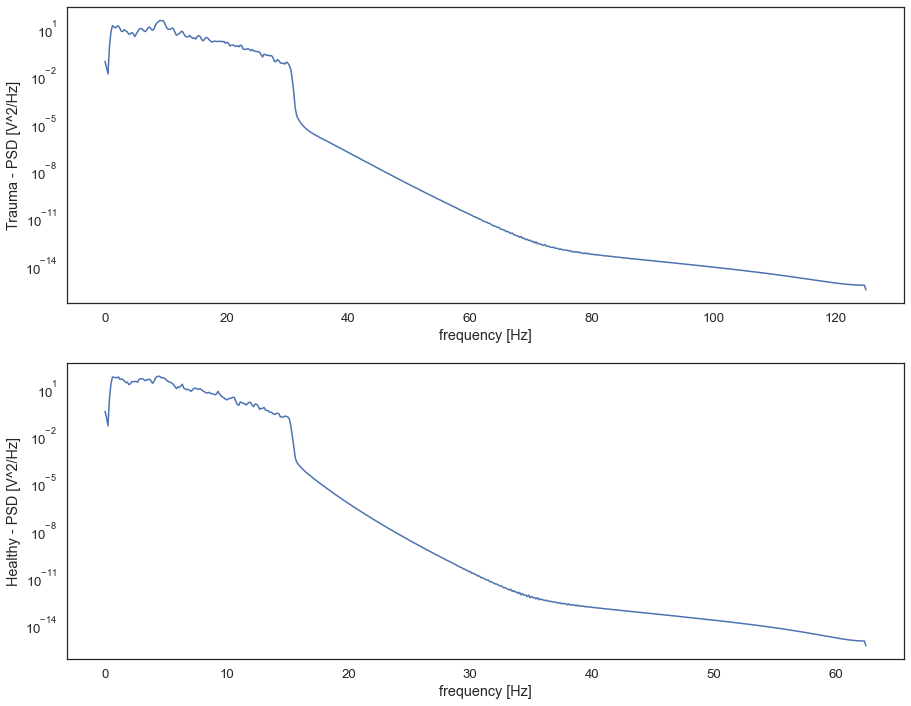

In [23]:
resample = sample1_.to_data_frame()
freqs, psd = welch(resample['F3'], fs = 250, nperseg=1024)

fig, axs = plt.subplots(nrows=2, ncols=1, figsize=[15,12])
axs[0].semilogy(freqs, psd)
axs[0].set_xlabel('frequency [Hz]')
axs[0].set_ylabel('Trauma - PSD [V^2/Hz]')

freqs, psd = welch(resample['F4'], fs=125, nperseg=1024)
axs[1].semilogy(freqs, psd)
axs[1].set_xlabel('frequency [Hz]')
axs[1].set_ylabel('Healthy - PSD [V^2/Hz]')

plt.show()

Effective window size : 8.192 (s)


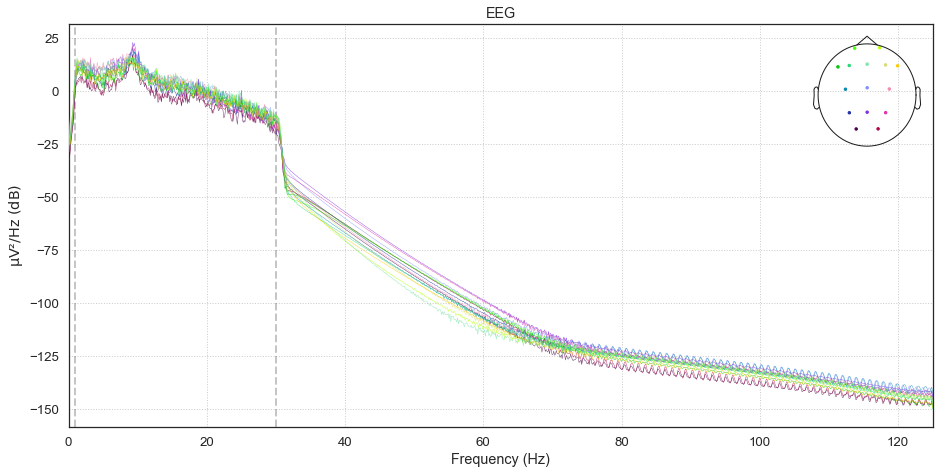

In [24]:
sample1_.plot_psd();

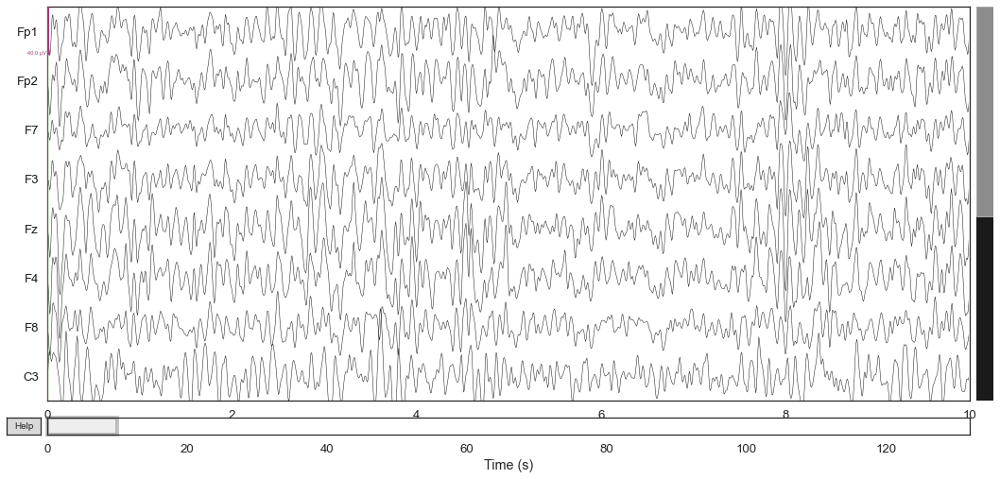

In [25]:
sample1_.plot(n_channels=8);

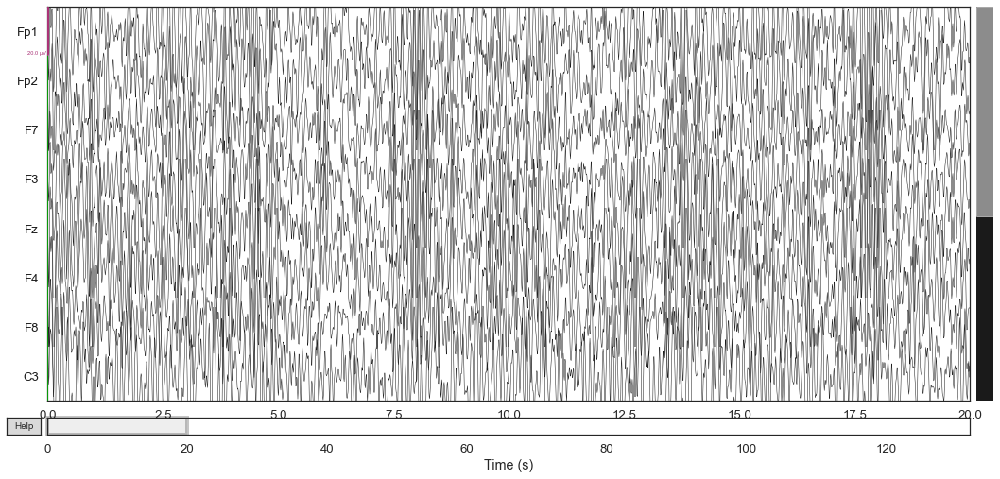

In [26]:
sample1_.plot(n_channels=8, duration=20, scalings={'eeg':1e-5});

* Raw 2

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 30.00 Hz: -6.02, -6.02 dB

Effective window size : 8.192 (s)


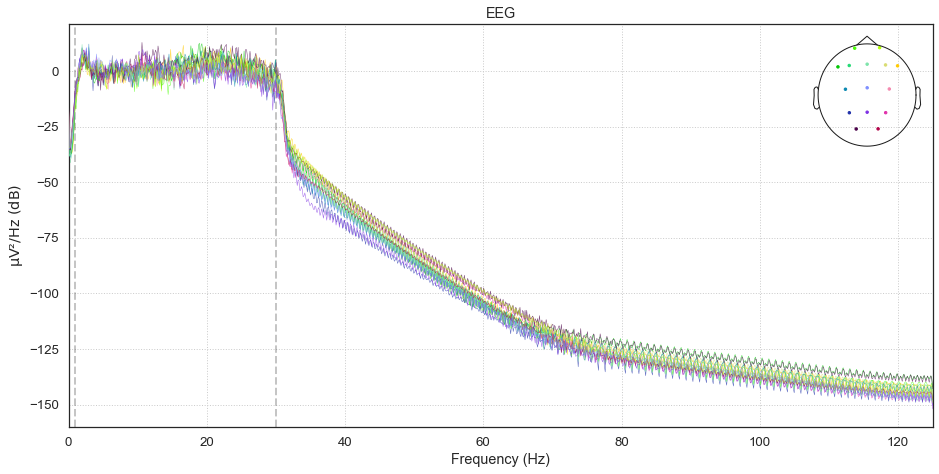

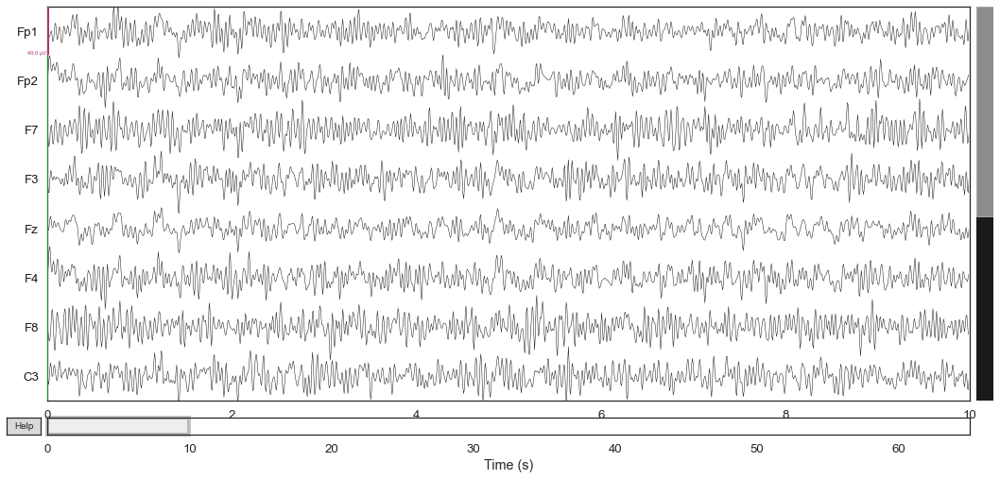

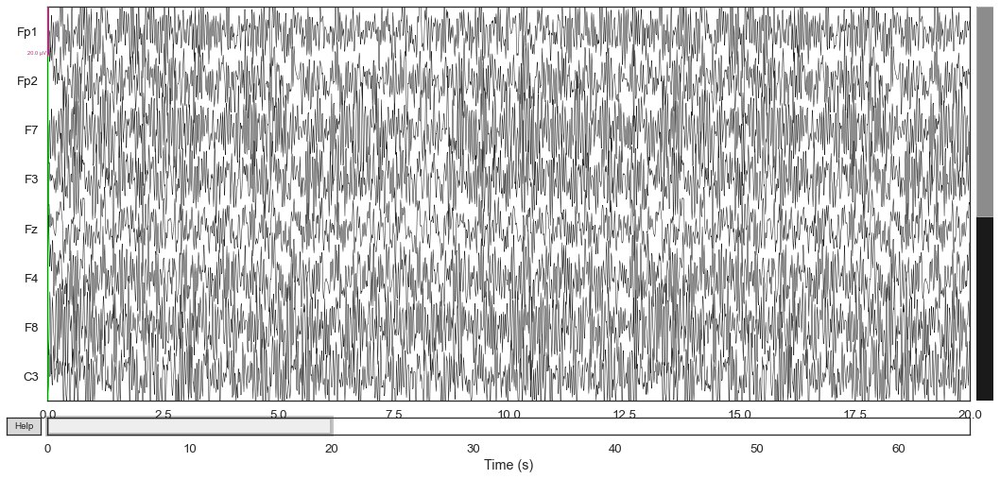

In [27]:
sample2_ = sample2.copy().filter(l_freq=1, h_freq=30, method='iir')
sample2_.plot_psd();
sample2_.plot(n_channels=8);
sample2_.plot(n_channels=8, duration=20, scalings={'eeg':1e-5});

* Raw 3

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 30.00 Hz: -6.02, -6.02 dB

Effective window size : 8.192 (s)


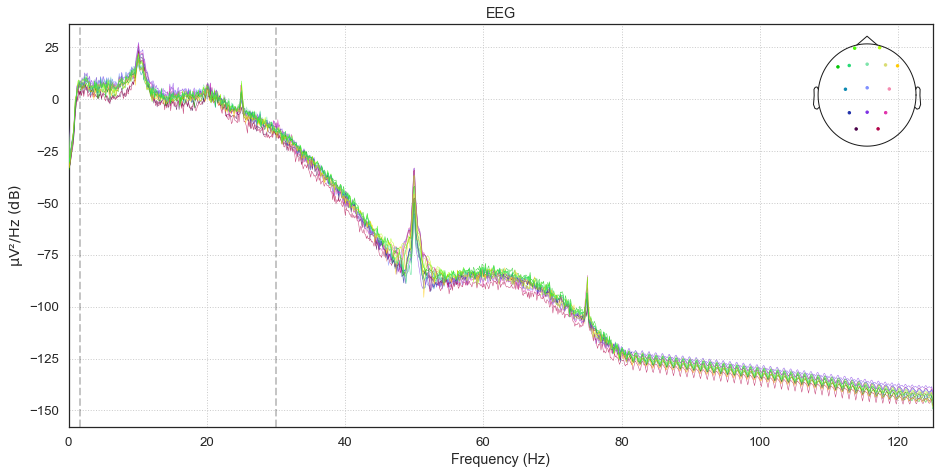

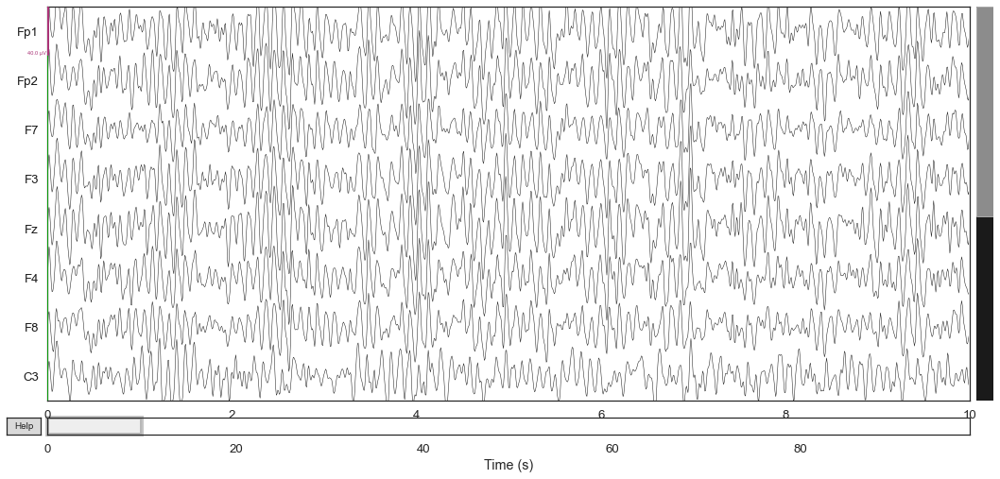

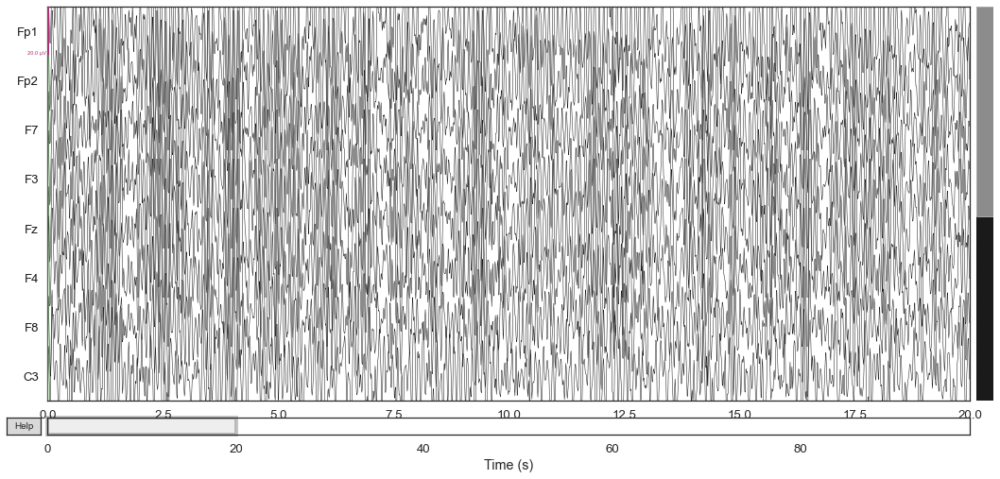

In [28]:
sample3_ = sample3.copy().filter(l_freq=1, h_freq=30, method='iir')
sample3_.plot_psd();
sample3_.plot(n_channels=8);
sample3_.plot(n_channels=8, duration=20, scalings={'eeg':1e-5});

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 30.00 Hz: -6.02, -6.02 dB

Effective window size : 8.192 (s)


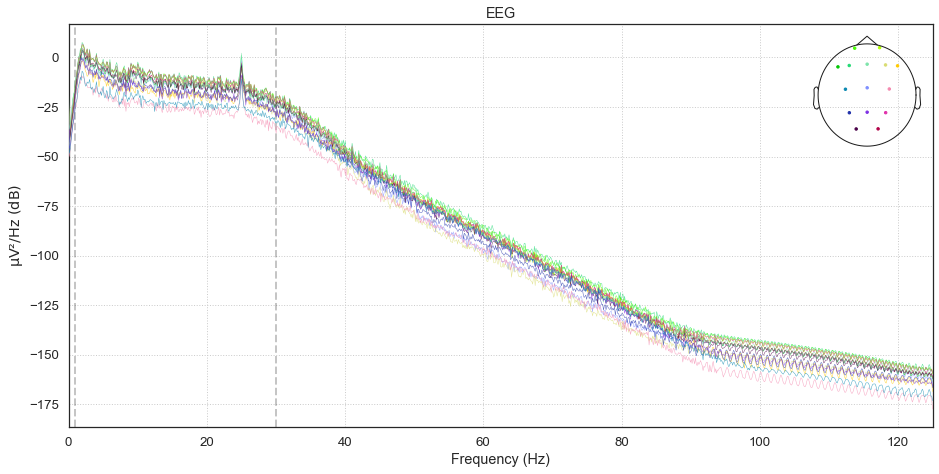

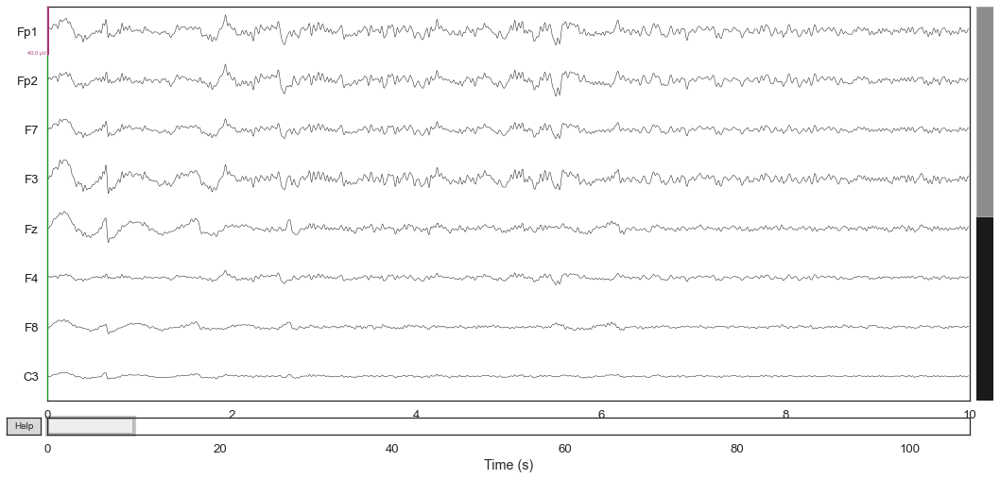

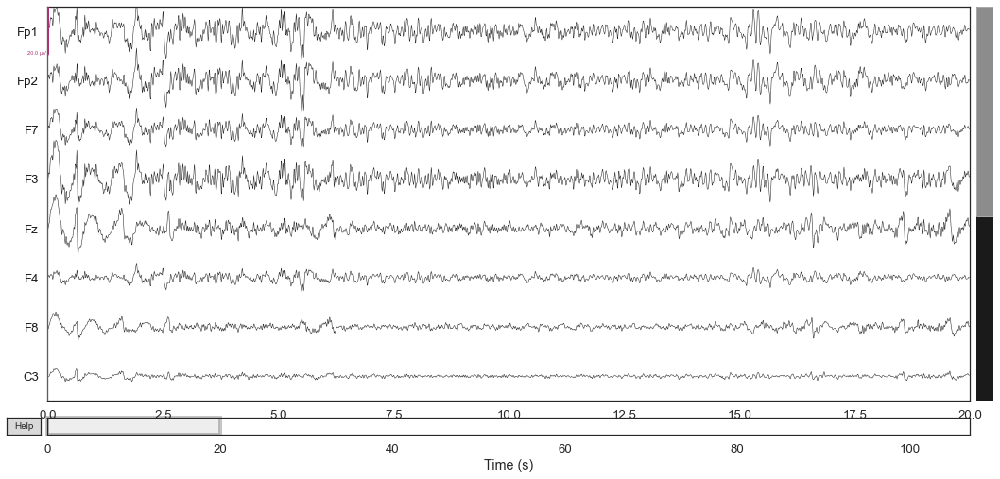

In [29]:
sample4_ = sample4.copy().filter(l_freq=1, h_freq=30, method='iir')
sample4_.plot_psd();
sample4_.plot(n_channels=8);
sample4_.plot(n_channels=8, duration=20, scalings={'eeg':1e-5});

### Low frequency drift

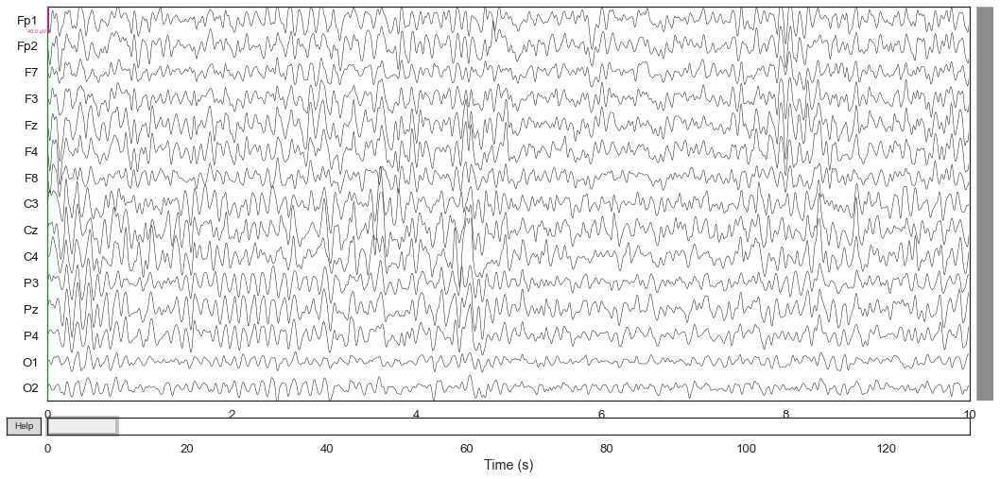

In [30]:
egg_channels = mne.pick_types(sample1_.info, eeg=True)
sample1_.plot(duration=10, order=egg_channels, n_channels=len(egg_channels),
         remove_dc=False);

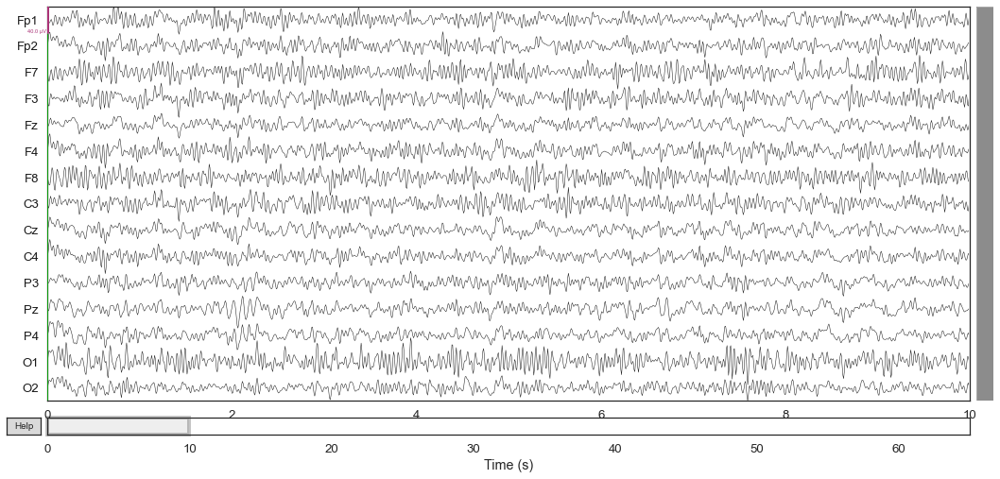

In [31]:
# Raw 2
egg_channels = mne.pick_types(sample2_.info, eeg=True)
sample2_.plot(duration=10, order=egg_channels, n_channels=len(egg_channels),
         remove_dc=False);

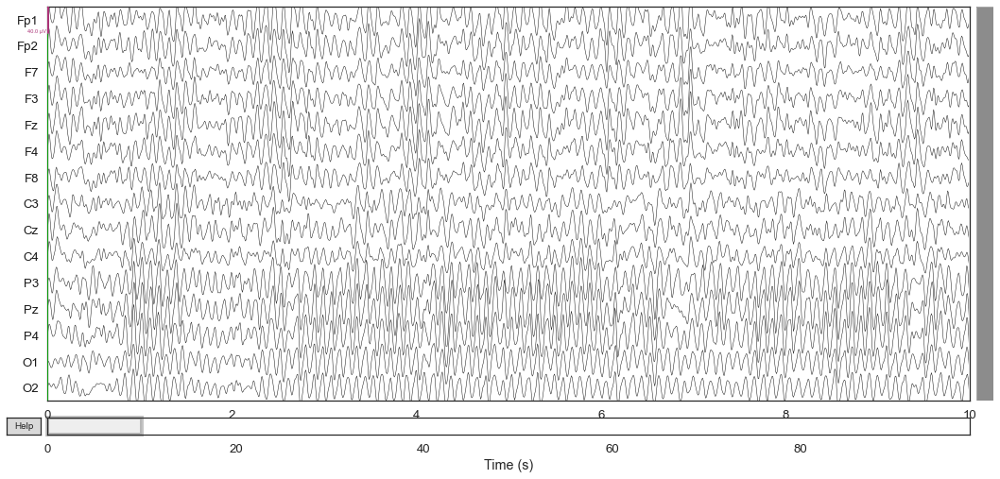

In [32]:
# Raw 3
egg_channels = mne.pick_types(sample3_.info, eeg=True)
sample3_.plot(duration=10, order=egg_channels, n_channels=len(egg_channels),
         remove_dc=False);

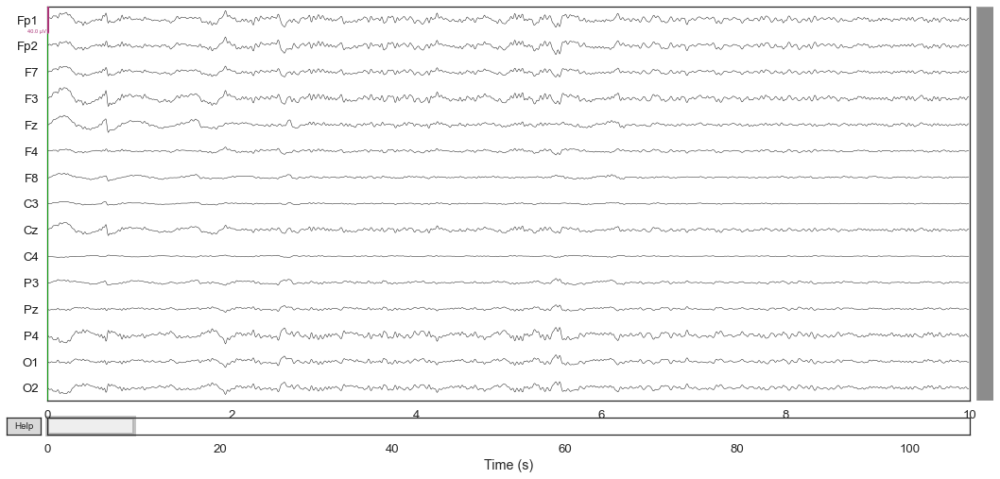

In [33]:
# Raw 4
egg_channels = mne.pick_types(sample4_.info, eeg=True)
sample4_.plot(duration=10, order=egg_channels, n_channels=len(egg_channels),
         remove_dc=False);

### Power line noise

Effective window size : 8.192 (s)


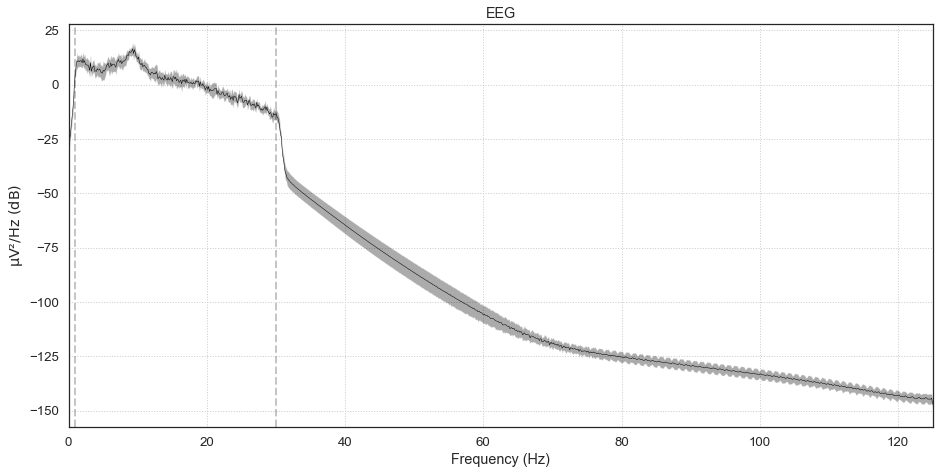

In [34]:
fig = sample1_.plot_psd(tmax=np.inf, fmax=125, average=True)
# add some arrows at 60 Hz and its harmonics:
for ax in fig.axes[:2]:
    freqs = ax.lines[-1].get_xdata()
    #print(freqs)
    psds = ax.lines[-1].get_ydata()
    for freq in (60, 120):
        idx = np.searchsorted(freqs, freq)
        #print(idx)
        ax.arrow(x=freqs[idx], y=psds[idx], dx=0, dy=-12, color='red',
                 width=0.1, head_width=3, length_includes_head=True)

### ICA

In [35]:
ica = mne.preprocessing.ICA(n_components=10, random_state=42)

In [36]:
ica.fit(sample1_)

Fitting ICA to data using 15 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 10 components
Fitting ICA took 0.2s.


<ICA | raw data decomposition, fit (fastica): 33000 samples, 10 components, channels used: "eeg">

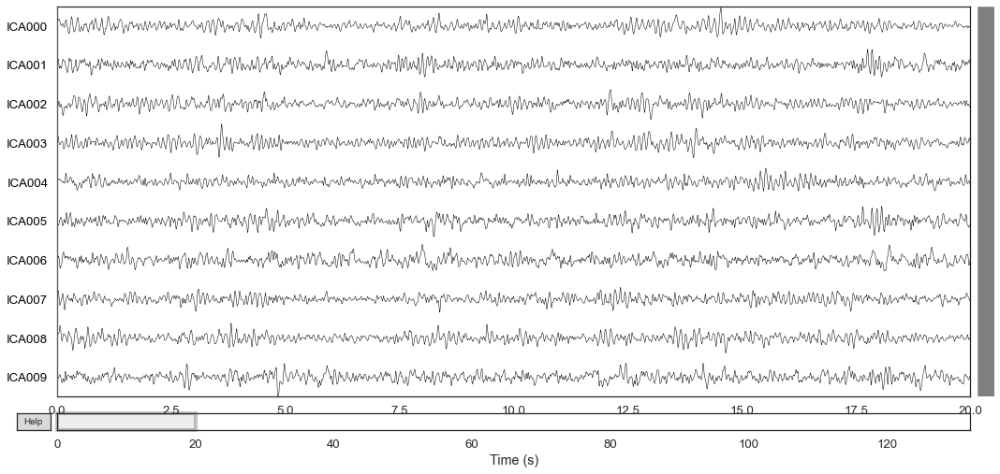

In [37]:
ica.plot_sources(sample1_);

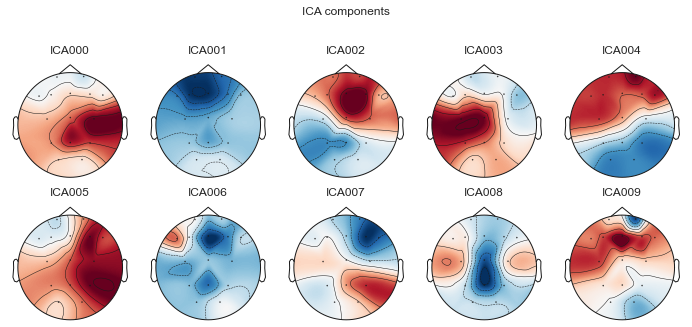

In [38]:
ica.plot_components();

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
66 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


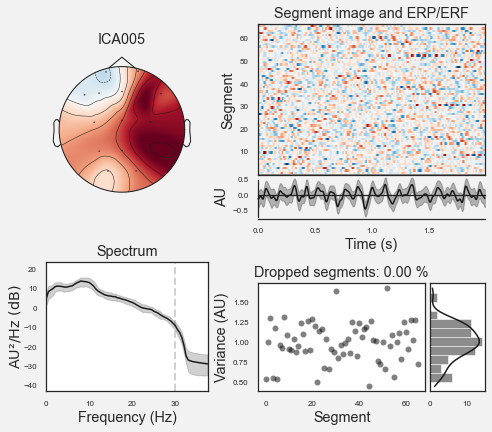

In [39]:
ica.plot_properties(sample1_, picks=[5]);

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


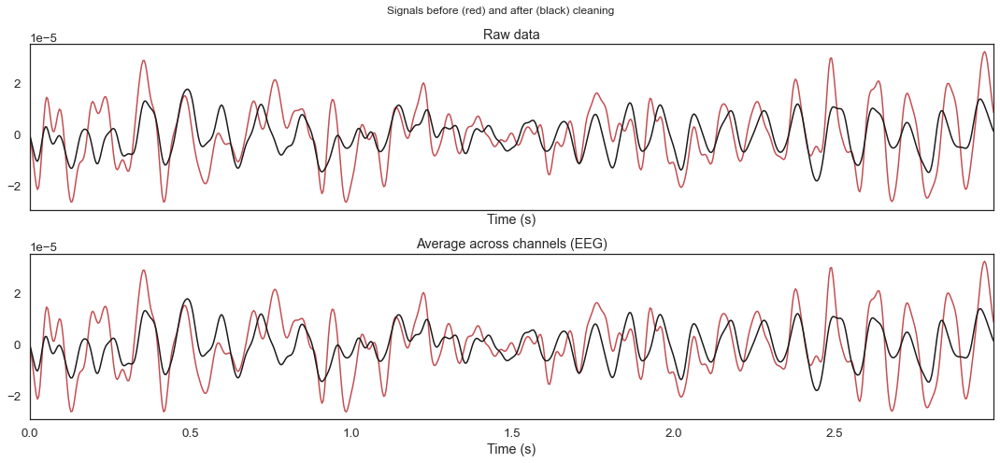

In [40]:
ica.plot_overlay(sample1_, exclude=[1, 4], picks=['Fp1']);

In [41]:
ica.exclude = [1, 4]

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


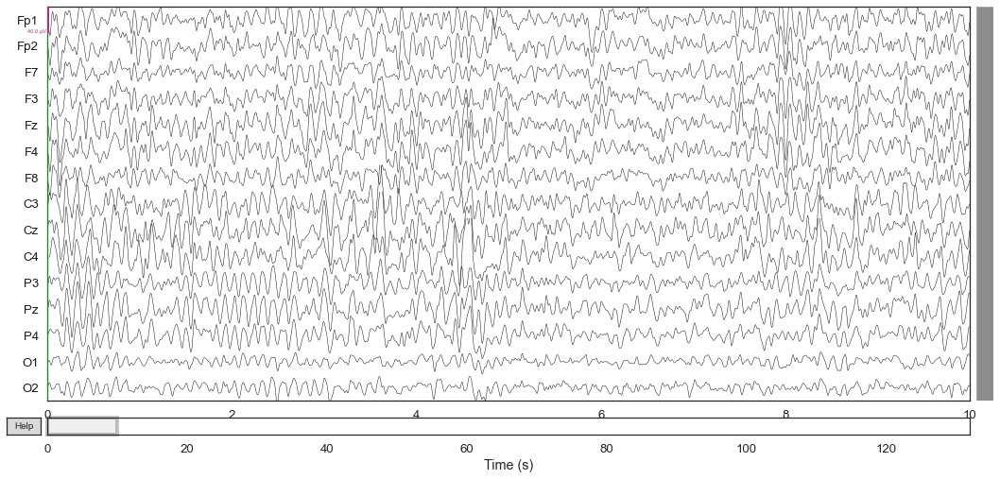

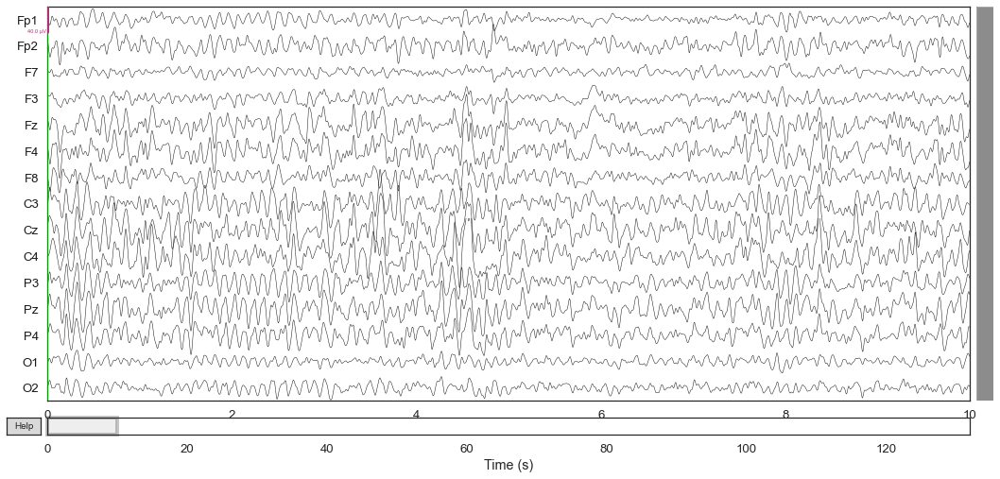

In [42]:
reconst_raw = sample1.copy()
ica.apply(reconst_raw)

sample1.plot(order=egg_channels, n_channels=len(egg_channels));
reconst_raw.plot(order=egg_channels, n_channels=len(egg_channels));
# del reconst_raw

Fitting ICA to data using 15 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 10 components
Fitting ICA took 0.5s.


/Users/jaspersw./anaconda3/envs/py37/lib/python3.7/site-packages/sklearn/decomposition/_fastica.py:120: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


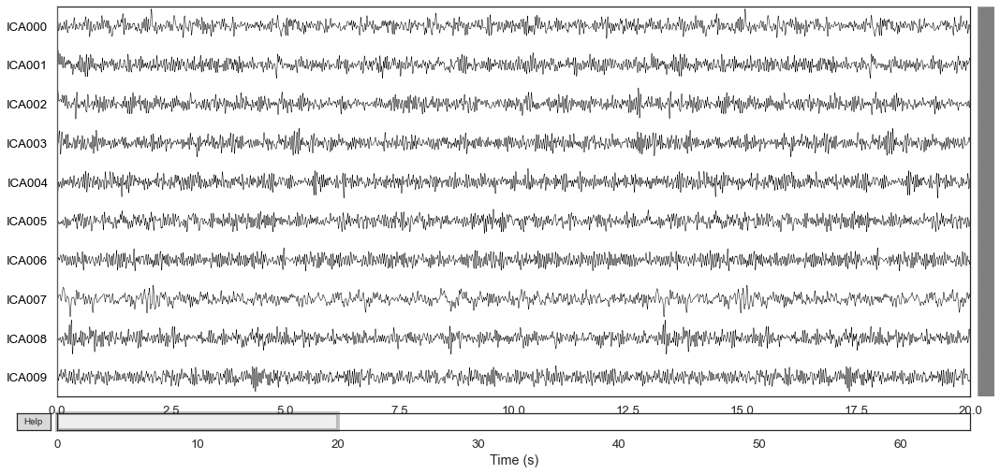

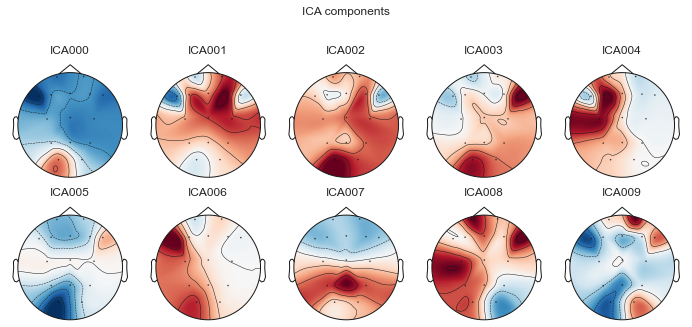

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


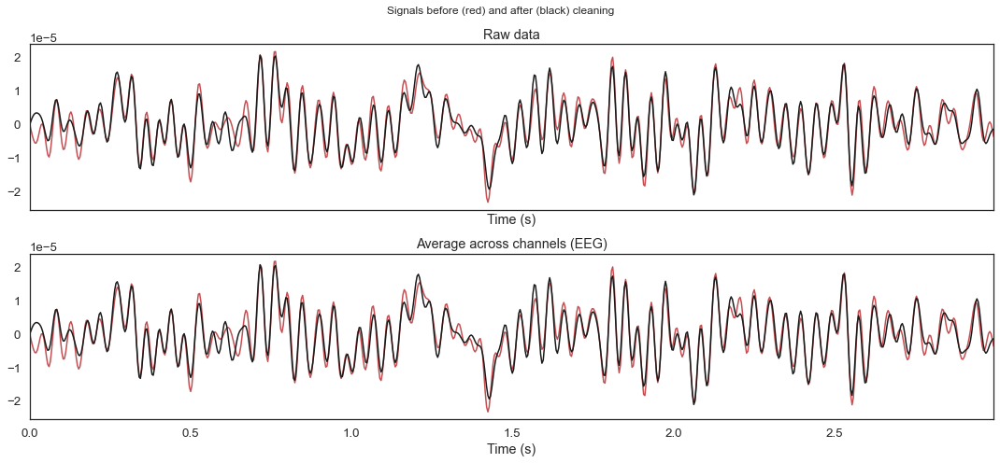

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


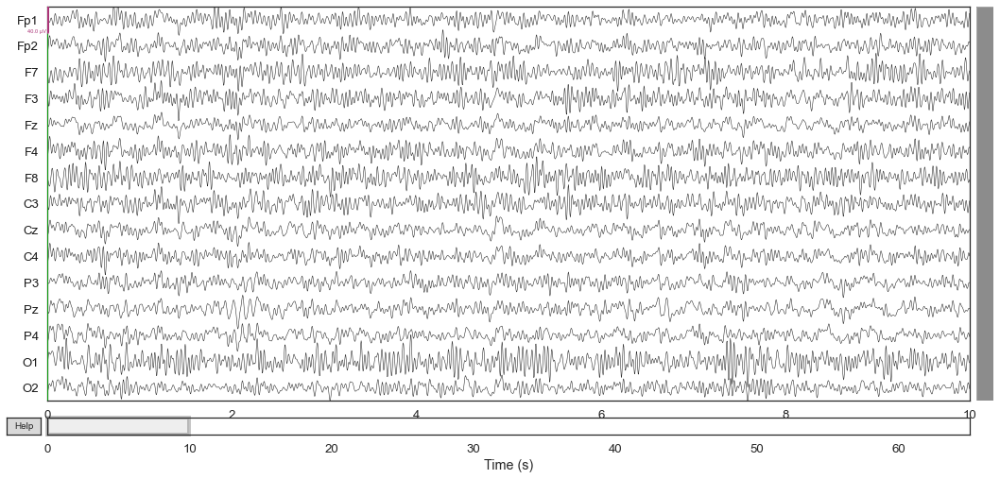

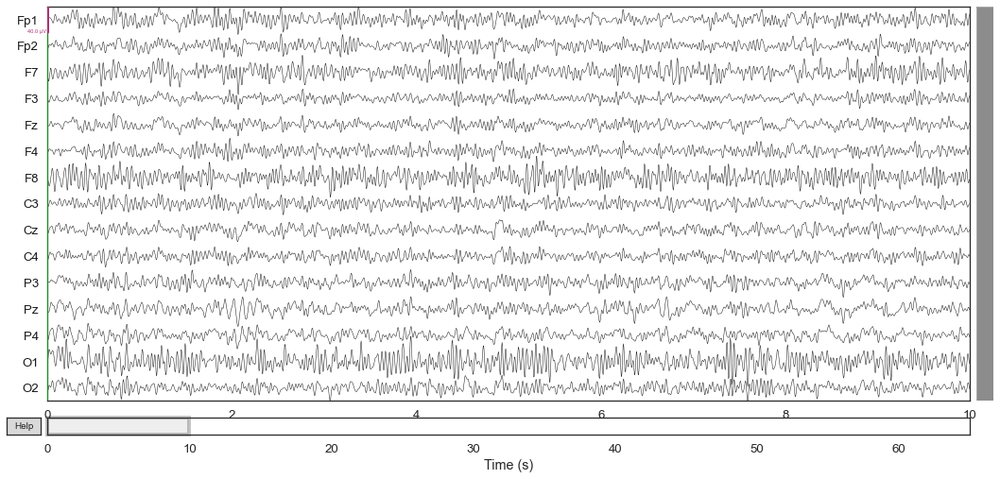

In [43]:
# Signal 2
ica2 = mne.preprocessing.ICA(n_components=10, random_state=42)
ica2.fit(sample2_)
ica2.plot_sources(sample2_);
ica2.plot_components();
ica2.plot_overlay(sample2_, exclude=[1, 4], picks=['Fp1']);
ica2.exclude = [1, 4]

reconst_raw = sample2.copy()
ica2.apply(reconst_raw)

sample2.plot(order=egg_channels, n_channels=len(egg_channels));
reconst_raw.plot(order=egg_channels, n_channels=len(egg_channels));


Fitting ICA to data using 15 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 10 components
Fitting ICA took 0.1s.


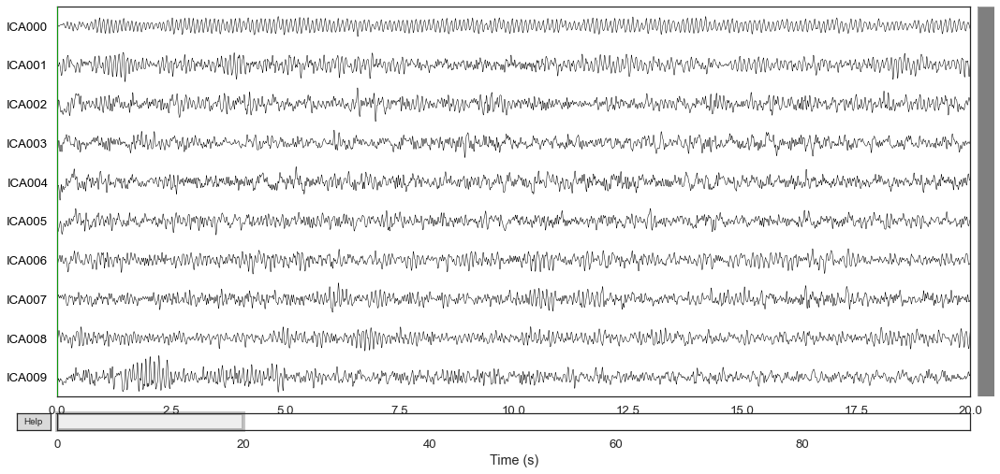

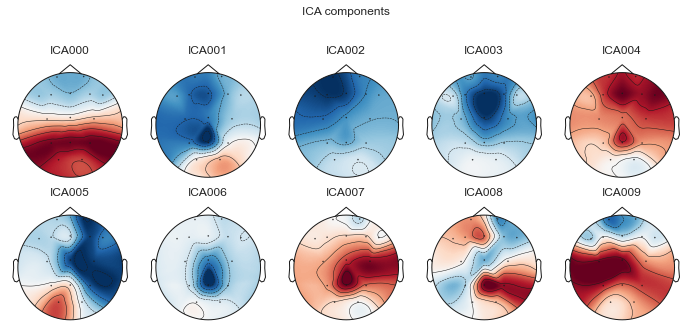

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


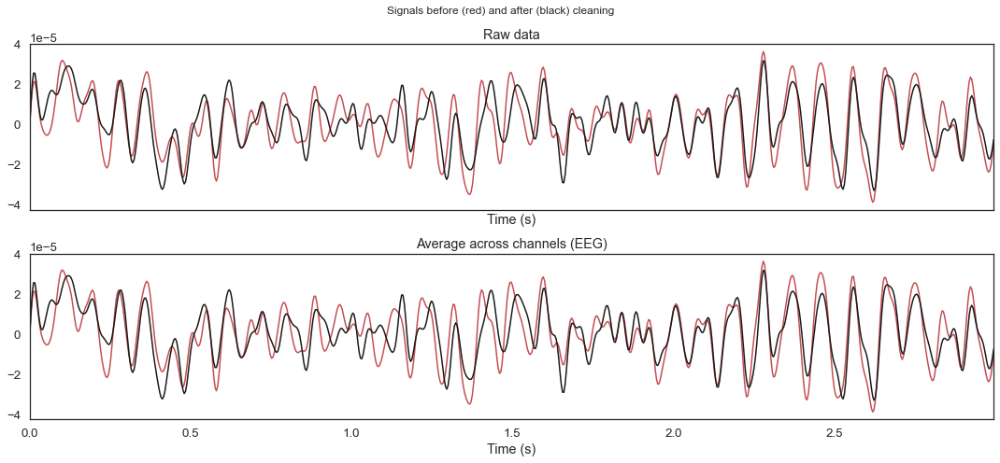

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


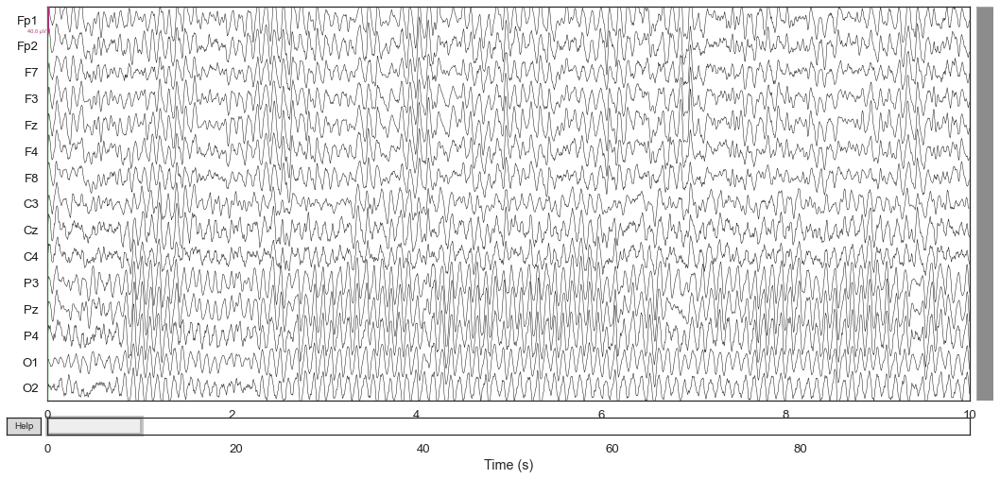

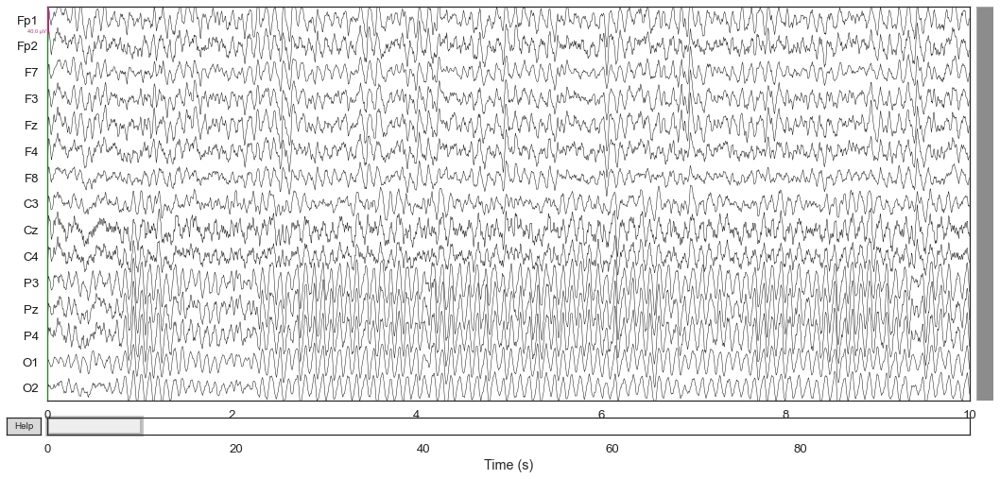

In [44]:
# Signal 3
ica3 = mne.preprocessing.ICA(n_components=10, random_state=42)
ica3.fit(sample3_)
ica3.plot_sources(sample3_);
ica3.plot_components();
ica3.plot_overlay(sample3_, exclude=[1, 4], picks=['Fp1']);
ica3.exclude = [1, 4]

reconst_raw = sample3.copy()
ica3.apply(reconst_raw)

sample3.plot(order=egg_channels, n_channels=len(egg_channels));
reconst_raw.plot(order=egg_channels, n_channels=len(egg_channels));

Fitting ICA to data using 15 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 10 components
Fitting ICA took 0.1s.


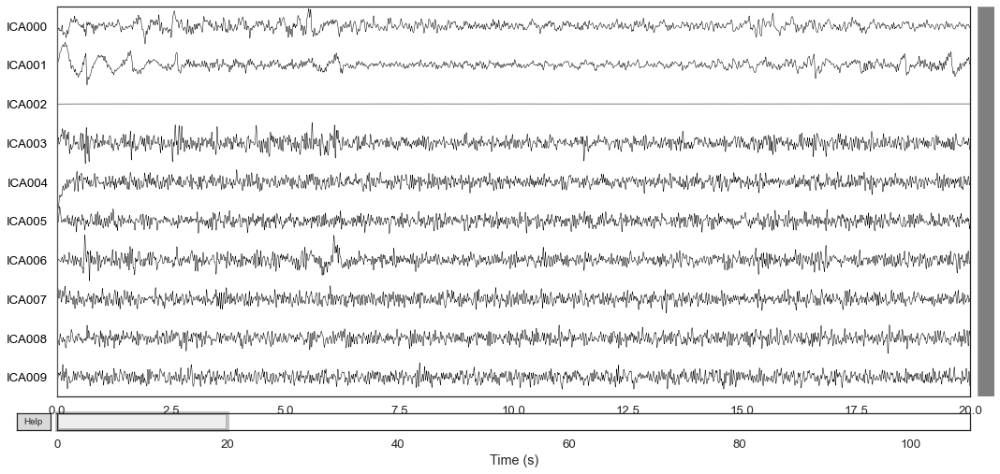

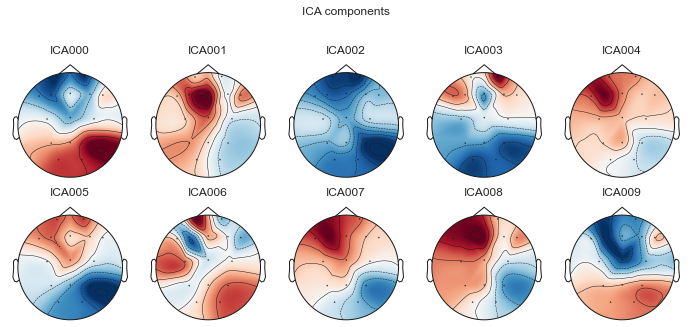

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


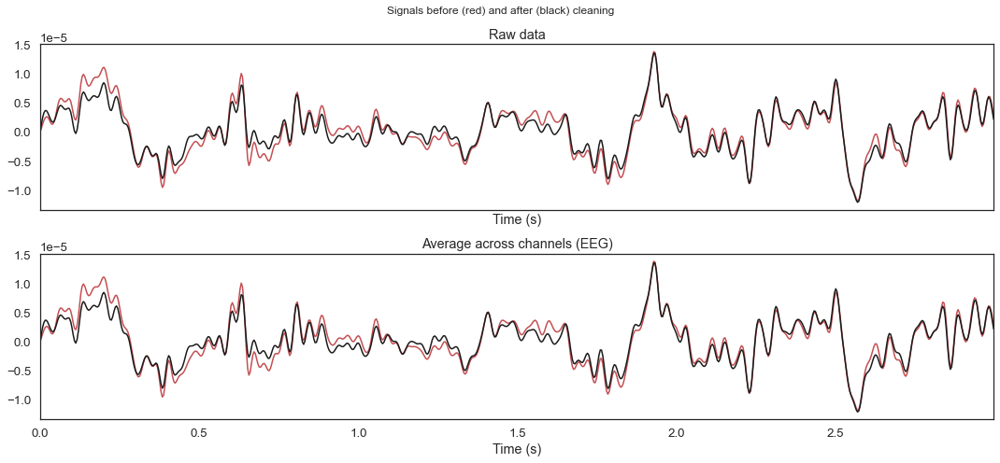

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


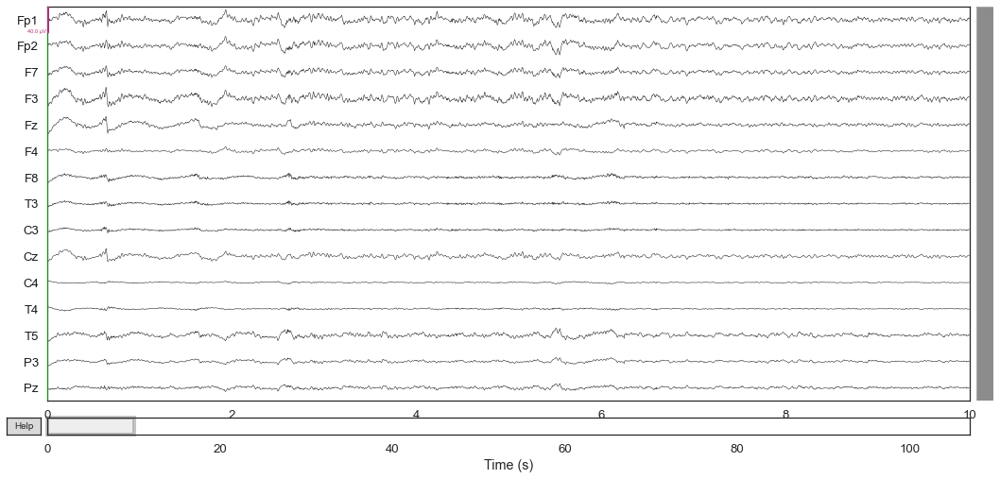

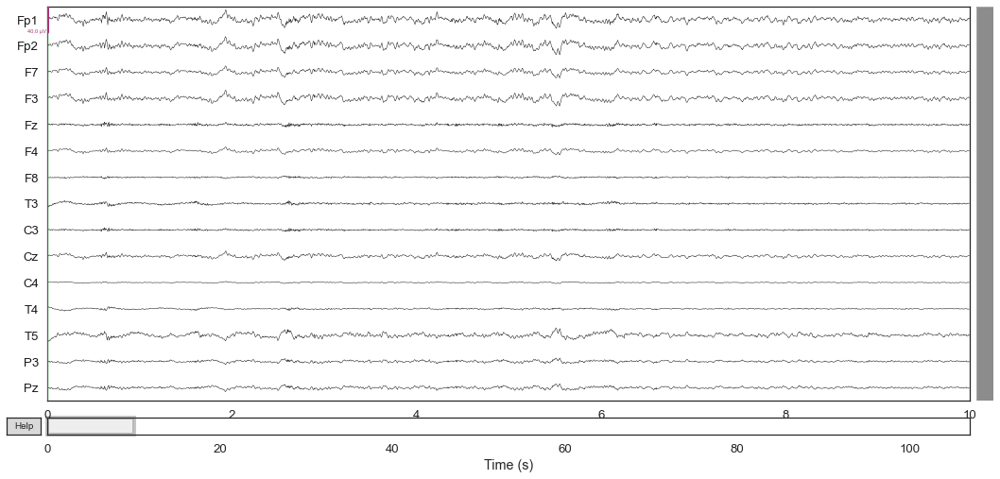

In [45]:
# Signal 4
ica4 = mne.preprocessing.ICA(n_components=10, random_state=42)
ica4.fit(sample4_)
ica4.plot_sources(sample4_);
ica4.plot_components();
ica4.plot_overlay(sample4_, exclude=[1, 4], picks=['Fp1']);
ica4.exclude = [1, 4]

reconst_raw = raw4.copy()
ica4.apply(reconst_raw)

raw4.plot(order=egg_channels, n_channels=len(egg_channels));
reconst_raw.plot(order=egg_channels, n_channels=len(egg_channels));
# del reconst_raw

### Amplitude of signal

In [47]:
raw_band = sample1_.copy()
raw_band.filter(10, 30, l_trans_bandwidth=1., h_trans_bandwidth=1.,
                fir_design='firwin',)

raw_hilb = raw_band.copy()
hilb_picks = mne.pick_types(raw_band.info, meg=False, eeg=True)
raw_hilb.apply_hilbert(hilb_picks)
print(raw_hilb[0][0].dtype)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 10 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 10.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 9.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 30.50 Hz)
- Filter length: 825 samples (3.300 sec)

complex128


In [48]:
# # Take the amplitude and phase
raw_amp = raw_hilb.copy()
raw_amp.apply_function(np.abs, hilb_picks)

# fig = plt.figure(figsize=(15, 10))
# plt.plot(raw_band[hilb_picks[0]][0][0].real)
# plt.plot(raw_amp[hilb_picks[0]][0][0].real)
# plt.title('Amplitude of frequency band')

<RawEDF | 2a4a9f39f461ddbd.edf, 15 x 33000 (132.0 s), ~7.6 MB, data loaded>

In [49]:
for i in range(len(raw_amp.ch_names)):
    print("Channel {} std:{} ".format(raw_amp.ch_names[i], np.std(raw_amp[i][0][0])))

Channel Fp1 std:4.836781769843751e-06 
Channel Fp2 std:4.777502820240316e-06 
Channel F7 std:3.6832660373222197e-06 
Channel F3 std:5.1421867131200534e-06 
Channel Fz std:5.841385515903409e-06 
Channel F4 std:5.388276693058534e-06 
Channel F8 std:4.019585205186418e-06 
Channel C3 std:5.366785903642787e-06 
Channel Cz std:5.513610548646614e-06 
Channel C4 std:5.339678472985692e-06 
Channel P3 std:4.265358900188327e-06 
Channel Pz std:6.020363476848074e-06 
Channel P4 std:4.7930426211809635e-06 
Channel O1 std:2.5562761675538346e-06 
Channel O2 std:2.7968421957807407e-06 


In [50]:
# Signal 2
raw_band = sample2_.copy()
raw_band.filter(10, 30, l_trans_bandwidth=1., h_trans_bandwidth=1.,
                fir_design='firwin',)

raw_hilb = raw_band.copy()
hilb_picks = mne.pick_types(raw_band.info, meg=False, eeg=True)
raw_hilb.apply_hilbert(hilb_picks)
print(raw_hilb[0][0].dtype)

# # Take the amplitude and phase
raw_amp = raw_hilb.copy()
raw_amp.apply_function(np.abs, hilb_picks)


for i in range(len(raw_amp.ch_names)):
    print("Channel {} std:{} ".format(raw_amp.ch_names[i], np.std(raw_amp[i][0][0])))

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 10 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 10.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 9.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 30.50 Hz)
- Filter length: 825 samples (3.300 sec)

complex128
Channel Fp1 std:3.566583682435537e-06 
Channel Fp2 std:3.675845078495785e-06 
Channel F7 std:4.988188239738789e-06 
Channel F3 std:4.324277432065497e-06 
Channel Fz std:2.5148171234010477e-06 
Channel F4 std:4.105244772076333e-06 
Channel F8 std:4.841119999783089e-06 
Channel C3 std:4.41658262881218e-06 
Channel Cz std:2.9029464648009236e-06 
Channel C4 std:3.4397157297812164e-06 
Channel P3 std:3.2611828334310043e-06 
Ch

In [51]:
# Signal 3
raw_band = sample3_.copy()
raw_band.filter(10, 30, l_trans_bandwidth=1., h_trans_bandwidth=1.,
                fir_design='firwin',)

raw_hilb = raw_band.copy()
hilb_picks = mne.pick_types(raw_band.info, meg=False, eeg=True)
raw_hilb.apply_hilbert(hilb_picks)
print(raw_hilb[0][0].dtype)

# # Take the amplitude and phase
raw_amp = raw_hilb.copy()
raw_amp.apply_function(np.abs, hilb_picks)


for i in range(len(raw_amp.ch_names)):
    print("Channel {} std:{} ".format(raw_amp.ch_names[i], np.std(raw_amp[i][0][0])))

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 10 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 10.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 9.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 30.50 Hz)
- Filter length: 825 samples (3.300 sec)

complex128
Channel Fp1 std:6.2650756468129775e-06 
Channel Fp2 std:5.971726219826834e-06 
Channel F7 std:4.828338589281522e-06 
Channel F3 std:5.725296364352914e-06 
Channel Fz std:6.721346689274978e-06 
Channel F4 std:5.362188293112581e-06 
Channel F8 std:4.5975591922407785e-06 
Channel C3 std:4.713901486429267e-06 
Channel Cz std:5.939493981625668e-06 
Channel C4 std:4.919223767653332e-06 
Channel P3 std:6.936677338155575e-06 
Cha

In [52]:
# Signal 4
raw_band = sample4_.copy()
raw_band.filter(10, 30, l_trans_bandwidth=1., h_trans_bandwidth=1.,
                fir_design='firwin',)

raw_hilb = raw_band.copy()
hilb_picks = mne.pick_types(raw_band.info, meg=False, eeg=True)
raw_hilb.apply_hilbert(hilb_picks)
print(raw_hilb[0][0].dtype)

# # Take the amplitude and phase
raw_amp = raw_hilb.copy()
raw_amp.apply_function(np.abs, hilb_picks)


for i in range(len(raw_amp.ch_names)):
    print("Channel {} std:{} ".format(raw_amp.ch_names[i], np.std(raw_amp[i][0][0])))

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 10 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 10.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 9.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 30.50 Hz)
- Filter length: 825 samples (3.300 sec)

complex128
Channel Fp1 std:1.0157592335998595e-06 
Channel Fp2 std:9.921361752333748e-07 
Channel F7 std:7.120472906848978e-07 
Channel F3 std:1.0647486677977166e-06 
Channel Fz std:8.837042229332098e-07 
Channel F4 std:4.463014709955028e-07 
Channel F8 std:4.7660105735949517e-07 
Channel C3 std:2.321981570041418e-07 
Channel Cz std:6.931952587150865e-07 
Channel C4 std:1.906246582274763e-07 
Channel P3 std:5.177843456026745e-07 
Ch